In [1]:
import shutil
shutil.move('../input/covid19-radiography-database/COVID-19_Radiography_Dataset', './COVID-19_Radiography_Dataset')

OSError: [Errno 30] Read-only file system: 'Lung_Opacity.metadata.xlsx'

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/working'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/working/__notebook__.ipynb
/kaggle/working/COVID-19_Radiography_Dataset/COVID.metadata.xlsx
/kaggle/working/COVID-19_Radiography_Dataset/Normal.metadata.xlsx
/kaggle/working/COVID-19_Radiography_Dataset/Lung_Opacity.metadata.xlsx
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia.metadata.xlsx
/kaggle/working/COVID-19_Radiography_Dataset/README.md.txt
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-1090.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-589.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-971.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-1170.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-139.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-321.png
/kaggle/working/COVID-19_Radiography_Dataset/Viral Pneumonia/Viral Pneumonia-908.png
/kaggle/working/COVID-19_Radiog

In [3]:
import os
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(10)

In [4]:
class_names = ['normal', 'viral', 'covid']
root_dir = './COVID-19_Radiography_Dataset'
source_dirs = ['Normal', 'Viral Pneumonia', 'COVID']

print('setting up training and test')
if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    print('creating test directory...')
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('png')]
        selected_images = random.sample(images, 80)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

setting up training and test
creating test directory...


In [5]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('png')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = ['normal', 'viral', 'covid']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

In [6]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [7]:
train_dirs = {
    'normal': './COVID-19_Radiography_Dataset/normal',
    'viral': './COVID-19_Radiography_Dataset/viral',
    'covid': './COVID-19_Radiography_Dataset/covid'
}

train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 10112 normal examples
Found 1265 viral examples
Found 3536 covid examples


In [8]:
test_dirs = {
    'normal': './COVID-19_Radiography_Dataset/test/normal',
    'viral': './COVID-19_Radiography_Dataset/test/viral',
    'covid': './COVID-19_Radiography_Dataset/test/covid'
}

test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 80 normal examples
Found 80 viral examples
Found 80 covid examples


In [9]:
batch_size = 4

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

In [10]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(8, 4))
    for i, image in enumerate(images):
        plt.subplot(1, batch_size, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

### Data Visualization

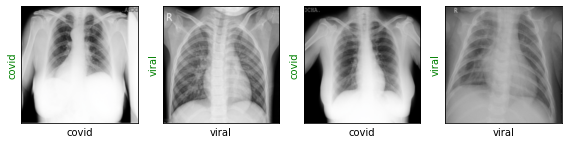

In [11]:
images, labels = next(iter(train_loader))
show_images(images, labels, labels)

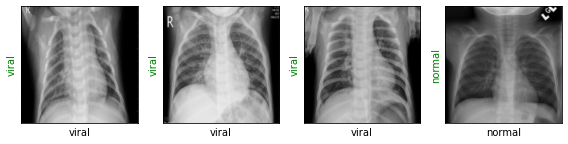

In [12]:
images, labels = next(iter(test_loader))
show_images(images, labels, labels)

### Using pretrained resnet50 Model to compare results with transfer learning vs. a new model

In [13]:
use_gpu = torch.cuda.is_available()

In [14]:
from torchvision.models import resnet50
resnet50 = resnet50(pretrained=True)
print(resnet50)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [15]:
resnet50.fc = torch.nn.Linear(in_features=2048, out_features=3)
if use_gpu:
    resnet50 = resnet50.cuda()
loss_fn = torch.nn.CrossEntropyLoss()
#optimizer = torch.optim.Adam(resnet50.parameters(), lr=3e-5)
optimizer = torch.optim.SGD(resnet50.parameters(), lr=3e-4, momentum=0.9)

In [16]:
from torch.autograd import Variable
def show_preds():
    resnet50.eval()
    images, labels = next(iter(test_loader))
    use_gpu = torch.cuda.is_available()
    if use_gpu:
        images, labels = Variable(images.cuda()), Variable(labels.cuda())
    else:
        images, labels = Variable(images), Variable(labels)
    
    outputs = resnet50(images)
    _, preds = torch.max(outputs, 1)
    
    show_images(images.cpu(), labels.cpu(), preds.cpu())

In [17]:
def train(epochs):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.
        use_gpu = torch.cuda.is_available()
        resnet50.train() # set model to training phase

        for train_step, (images, labels) in enumerate(train_loader):
            optimizer.zero_grad()
            if use_gpu:
                images, labels = Variable(images.cuda()), Variable(labels.cuda())
            else:
                images, labels = Variable(images), Variable(labels)
            outputs = resnet50(images)
            
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet50.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(test_loader):
                    if use_gpu:
                        images, labels = Variable(images.cuda()), Variable(labels.cuda())
                    else:
                        images, labels = Variable(images), Variable(labels)
                    outputs = resnet50(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    if use_gpu:
                        accuracy += sum((preds.cpu() == labels.cpu()).numpy())
                    else:
                        accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                resnet50.train()

                if accuracy >= 0.98:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

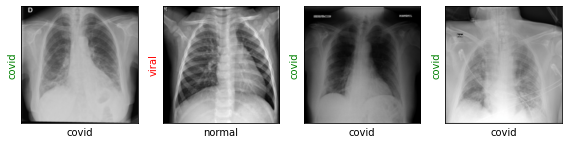

In [18]:
show_preds()

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.1133, Accuracy: 0.3583


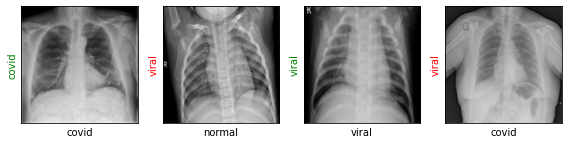

Evaluating at step 20
Validation Loss: 0.9772, Accuracy: 0.5417


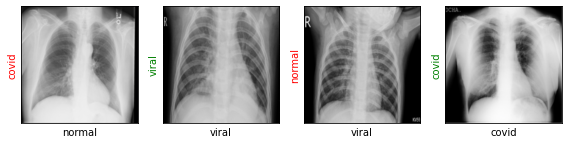

Evaluating at step 40
Validation Loss: 0.8447, Accuracy: 0.5958


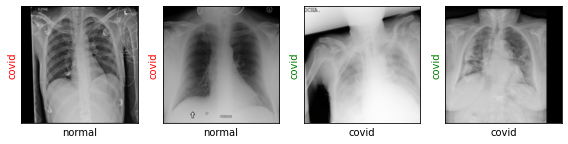

Evaluating at step 60
Validation Loss: 0.6515, Accuracy: 0.7542


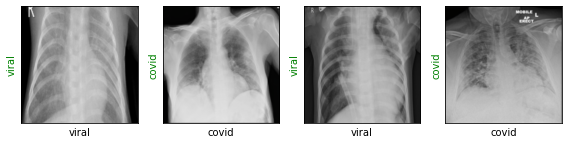

Evaluating at step 80
Validation Loss: 0.6768, Accuracy: 0.6333


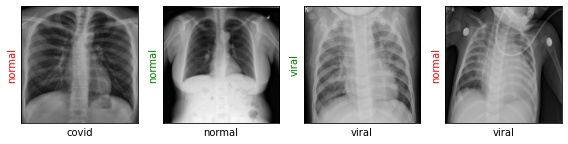

Evaluating at step 100
Validation Loss: 0.5217, Accuracy: 0.8125


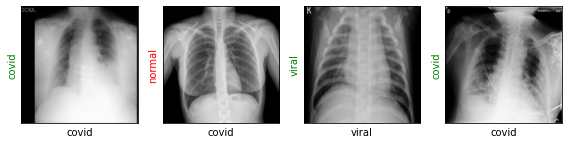

Evaluating at step 120
Validation Loss: 0.5953, Accuracy: 0.7708


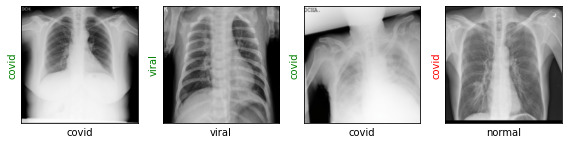

Evaluating at step 140
Validation Loss: 0.5082, Accuracy: 0.8167


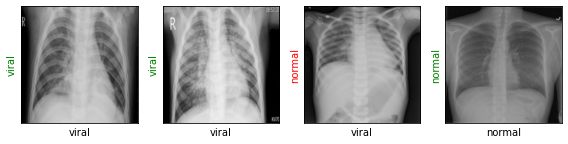

Evaluating at step 160
Validation Loss: 0.5288, Accuracy: 0.7500


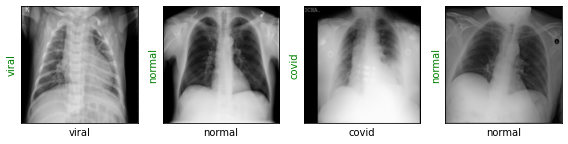

Evaluating at step 180
Validation Loss: 0.4157, Accuracy: 0.8583


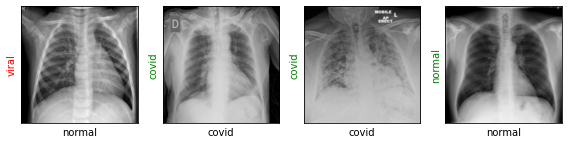

Evaluating at step 200
Validation Loss: 0.3316, Accuracy: 0.8875


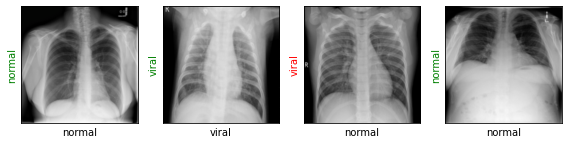

Evaluating at step 220
Validation Loss: 0.3284, Accuracy: 0.8792


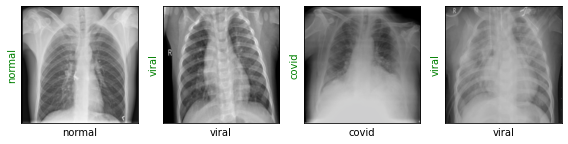

Evaluating at step 240
Validation Loss: 0.4062, Accuracy: 0.8417


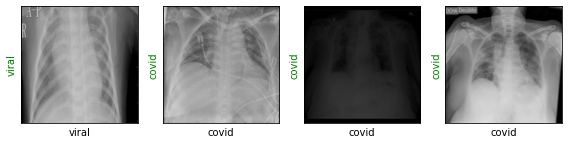

Evaluating at step 260
Validation Loss: 0.3583, Accuracy: 0.8333


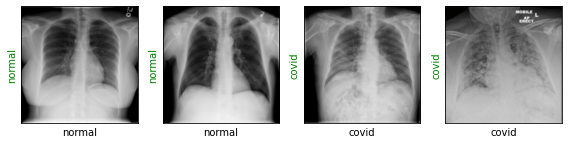

Evaluating at step 280
Validation Loss: 0.3063, Accuracy: 0.8542


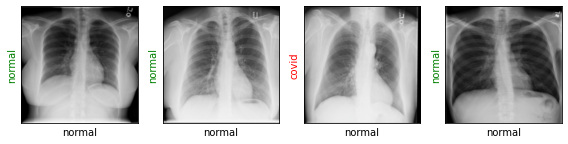

Evaluating at step 300
Validation Loss: 0.2854, Accuracy: 0.9083


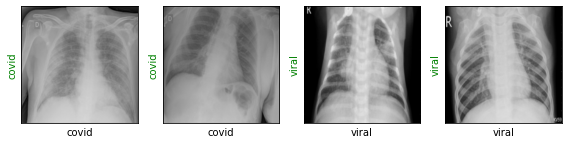

Evaluating at step 320
Validation Loss: 0.3269, Accuracy: 0.8833


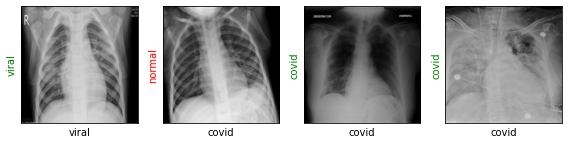

Evaluating at step 340
Validation Loss: 0.3246, Accuracy: 0.8542


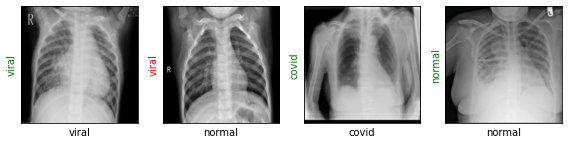

Evaluating at step 360
Validation Loss: 0.3112, Accuracy: 0.8708


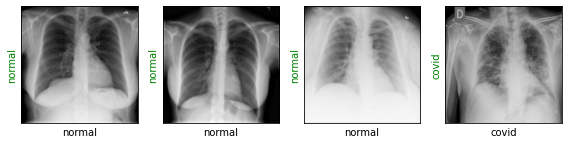

Evaluating at step 380
Validation Loss: 0.3205, Accuracy: 0.8917


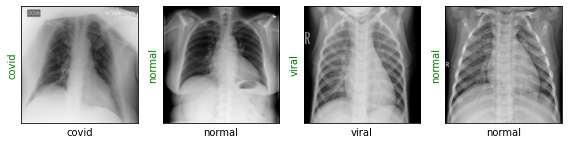

Evaluating at step 400
Validation Loss: 0.2468, Accuracy: 0.9417


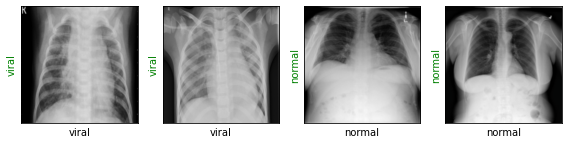

Evaluating at step 420
Validation Loss: 0.2780, Accuracy: 0.9083


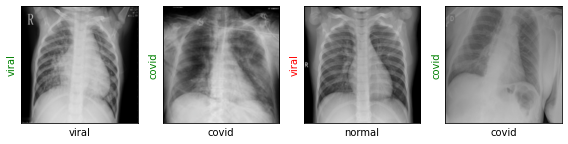

Evaluating at step 440
Validation Loss: 0.2905, Accuracy: 0.9125


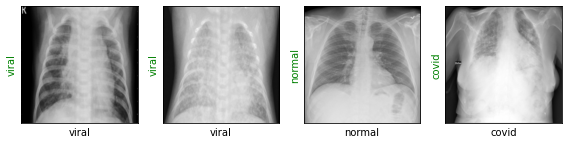

Evaluating at step 460
Validation Loss: 0.2945, Accuracy: 0.8917


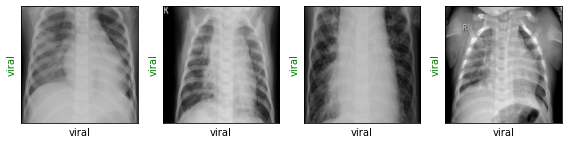

Evaluating at step 480
Validation Loss: 0.3381, Accuracy: 0.8708


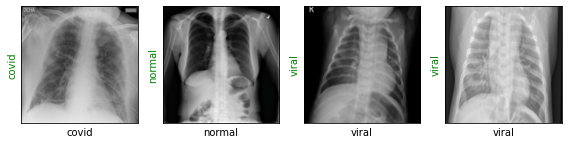

Evaluating at step 500
Validation Loss: 0.2555, Accuracy: 0.9042


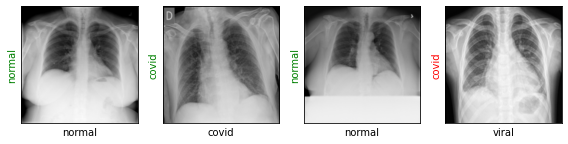

Evaluating at step 520
Validation Loss: 0.2640, Accuracy: 0.9042


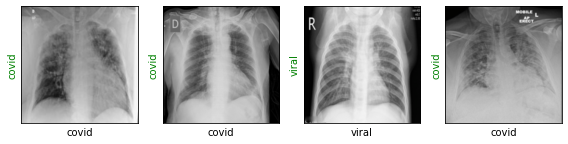

Evaluating at step 540
Validation Loss: 0.3072, Accuracy: 0.8917


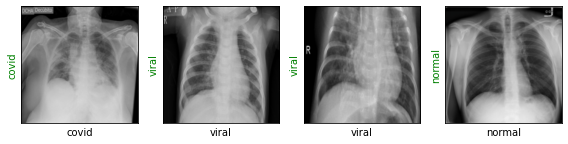

Evaluating at step 560
Validation Loss: 0.2730, Accuracy: 0.9208


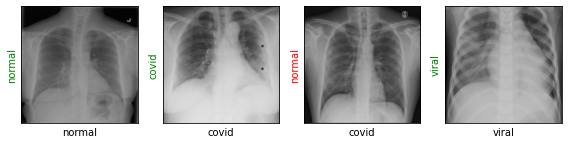

Evaluating at step 580
Validation Loss: 0.2328, Accuracy: 0.9000


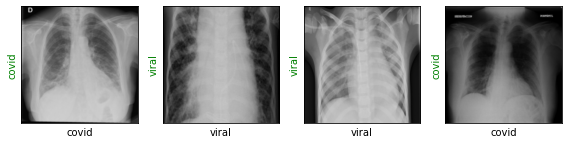

Evaluating at step 600
Validation Loss: 0.1685, Accuracy: 0.9708


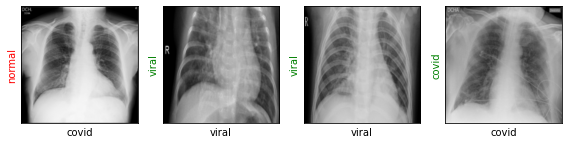

Evaluating at step 620
Validation Loss: 0.1684, Accuracy: 0.9500


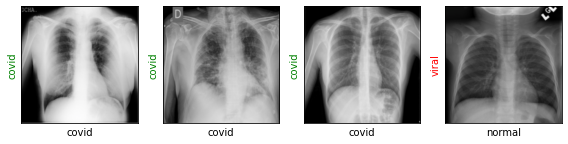

Evaluating at step 640
Validation Loss: 0.2406, Accuracy: 0.8875


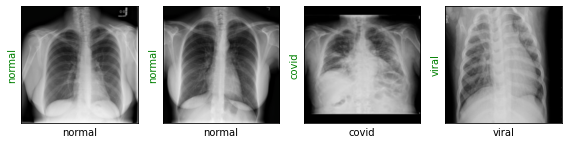

Evaluating at step 660
Validation Loss: 0.2564, Accuracy: 0.9000


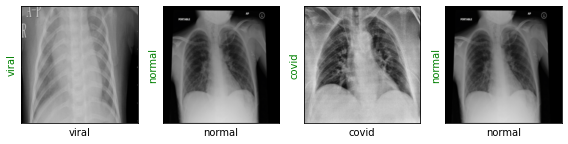

Evaluating at step 680
Validation Loss: 0.3586, Accuracy: 0.8625


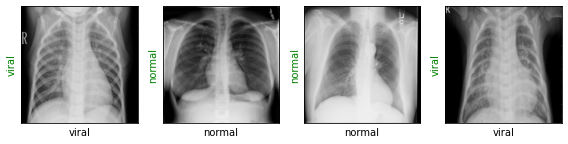

Evaluating at step 700
Validation Loss: 0.2147, Accuracy: 0.9042


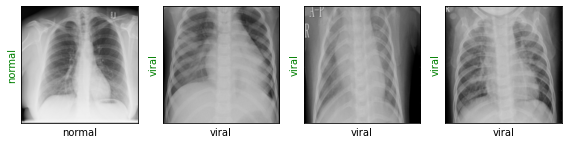

Evaluating at step 720
Validation Loss: 0.1904, Accuracy: 0.9375


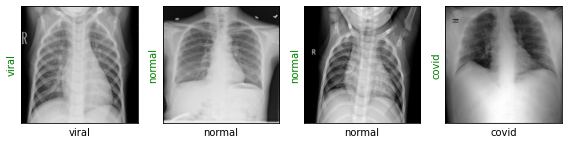

Evaluating at step 740
Validation Loss: 0.1678, Accuracy: 0.9417


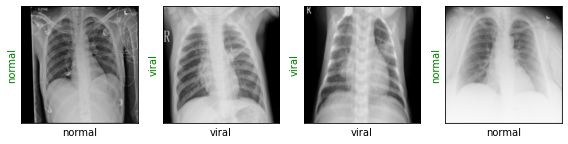

Evaluating at step 760
Validation Loss: 0.2804, Accuracy: 0.8833


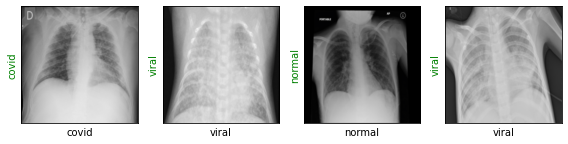

Evaluating at step 780
Validation Loss: 0.1771, Accuracy: 0.9417


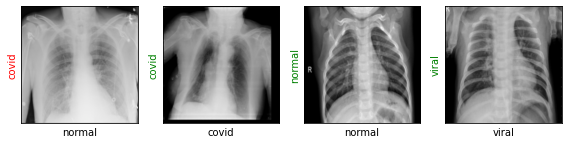

Evaluating at step 800
Validation Loss: 0.1718, Accuracy: 0.9458


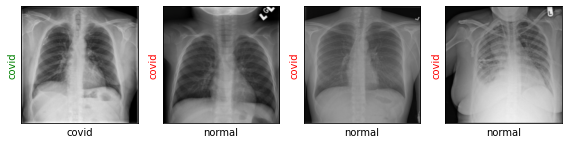

Evaluating at step 820
Validation Loss: 0.1703, Accuracy: 0.9542


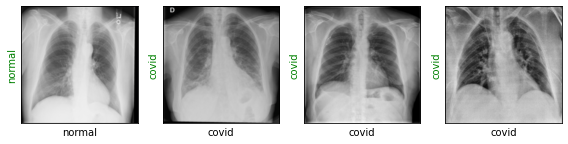

Evaluating at step 840
Validation Loss: 0.1976, Accuracy: 0.9167


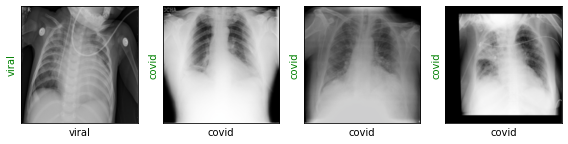

Evaluating at step 860
Validation Loss: 0.2523, Accuracy: 0.9125


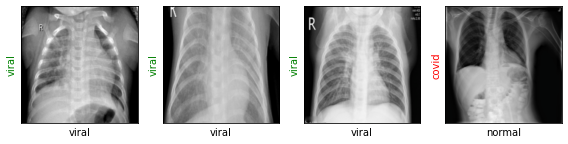

Evaluating at step 880
Validation Loss: 0.1768, Accuracy: 0.9500


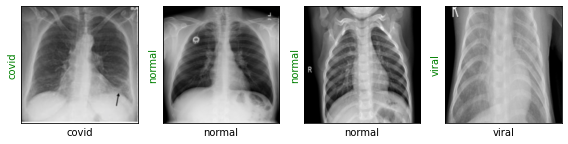

Evaluating at step 900
Validation Loss: 0.2266, Accuracy: 0.9208


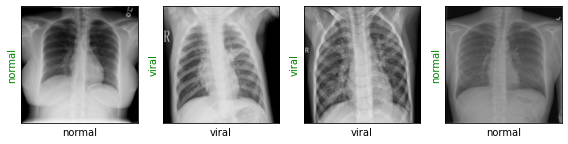

Evaluating at step 920
Validation Loss: 0.1796, Accuracy: 0.9375


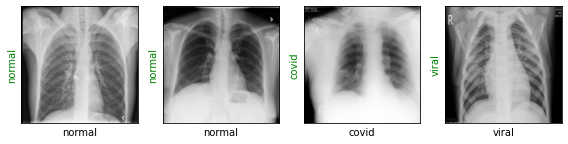

Evaluating at step 940
Validation Loss: 0.1850, Accuracy: 0.9250


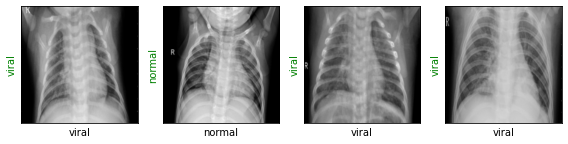

Evaluating at step 960
Validation Loss: 0.2337, Accuracy: 0.9125


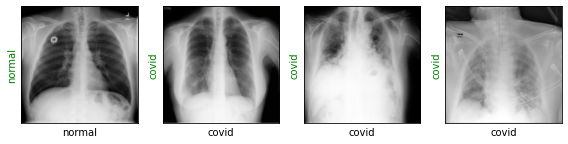

Evaluating at step 980
Validation Loss: 0.1498, Accuracy: 0.9500


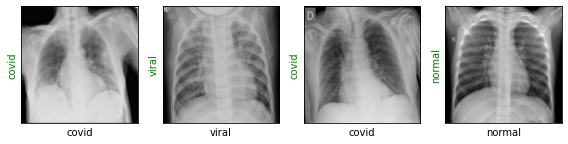

Evaluating at step 1000
Validation Loss: 0.2232, Accuracy: 0.9000


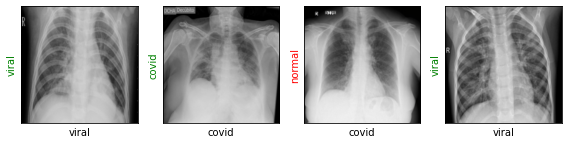

Evaluating at step 1020
Validation Loss: 0.1276, Accuracy: 0.9625


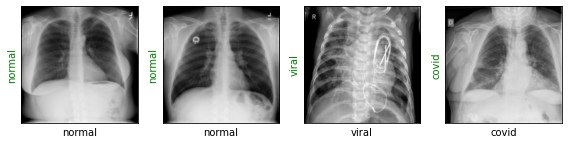

Evaluating at step 1040
Validation Loss: 0.1974, Accuracy: 0.9333


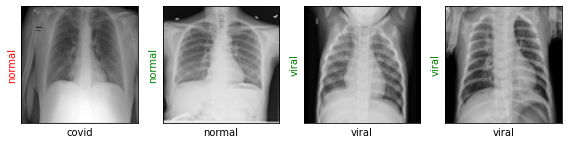

Evaluating at step 1060
Validation Loss: 0.2237, Accuracy: 0.9208


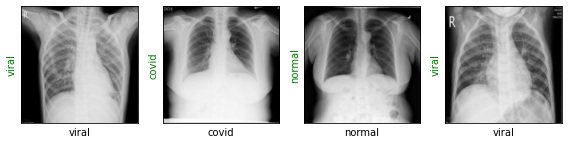

Evaluating at step 1080
Validation Loss: 0.1823, Accuracy: 0.9042


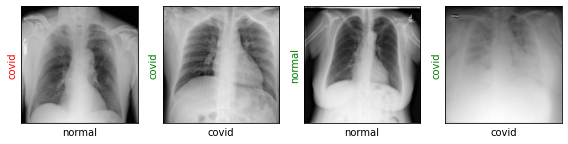

Evaluating at step 1100
Validation Loss: 0.1590, Accuracy: 0.9542


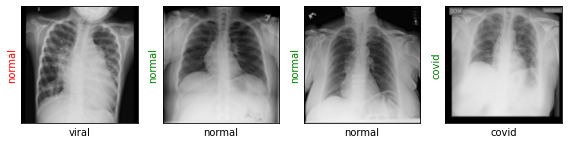

Evaluating at step 1120
Validation Loss: 0.1902, Accuracy: 0.9208


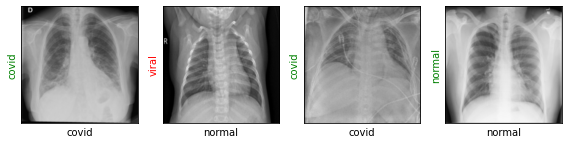

Evaluating at step 1140
Validation Loss: 0.1827, Accuracy: 0.9292


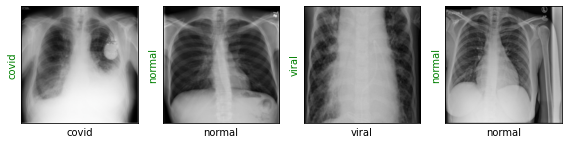

Evaluating at step 1160
Validation Loss: 0.2072, Accuracy: 0.9042


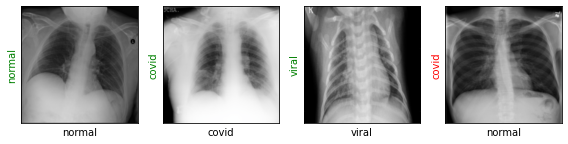

Evaluating at step 1180
Validation Loss: 0.1289, Accuracy: 0.9708


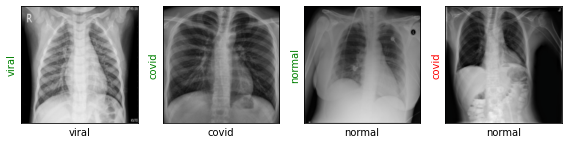

Evaluating at step 1200
Validation Loss: 0.1264, Accuracy: 0.9625


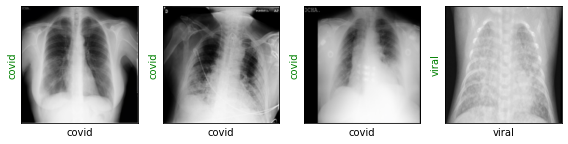

Evaluating at step 1220
Validation Loss: 0.1353, Accuracy: 0.9500


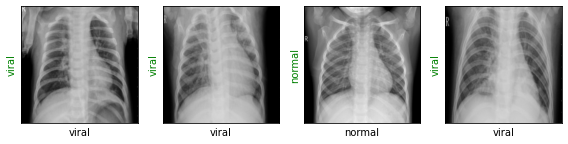

Evaluating at step 1240
Validation Loss: 0.0963, Accuracy: 0.9792


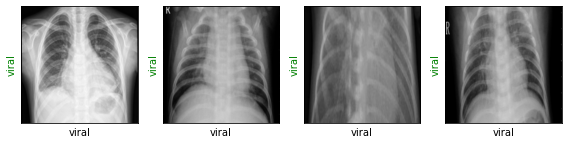

Evaluating at step 1260
Validation Loss: 0.1469, Accuracy: 0.9417


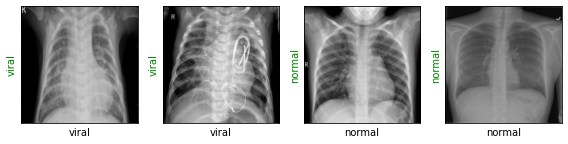

Evaluating at step 1280
Validation Loss: 0.1251, Accuracy: 0.9375


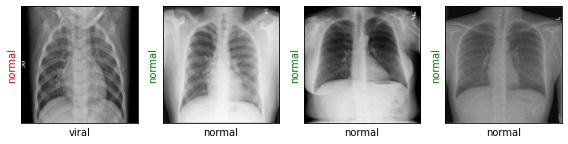

Evaluating at step 1300
Validation Loss: 0.1896, Accuracy: 0.9125


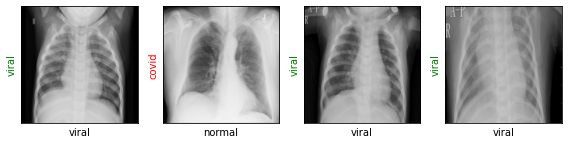

Evaluating at step 1320
Validation Loss: 0.1961, Accuracy: 0.9125


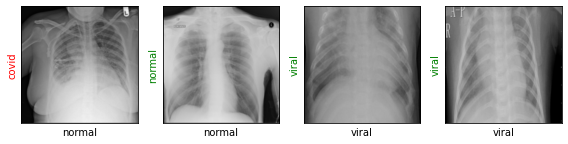

Evaluating at step 1340
Validation Loss: 0.2242, Accuracy: 0.9125


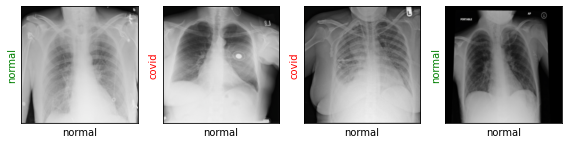

Evaluating at step 1360
Validation Loss: 0.1214, Accuracy: 0.9625


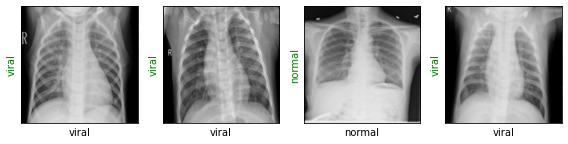

Evaluating at step 1380
Validation Loss: 0.1485, Accuracy: 0.9417


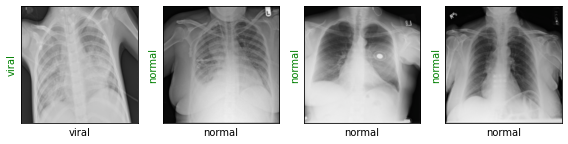

Evaluating at step 1400
Validation Loss: 0.1293, Accuracy: 0.9500


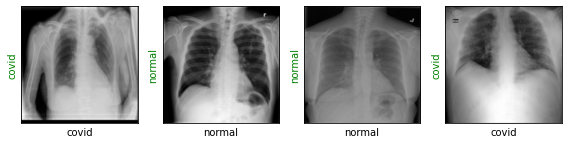

Evaluating at step 1420
Validation Loss: 0.1216, Accuracy: 0.9500


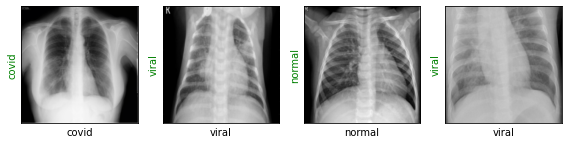

Evaluating at step 1440
Validation Loss: 0.1329, Accuracy: 0.9458


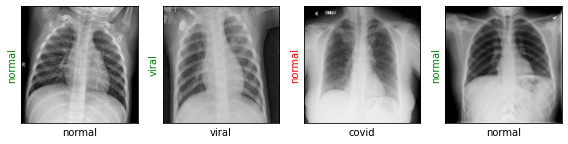

Evaluating at step 1460
Validation Loss: 0.1760, Accuracy: 0.9458


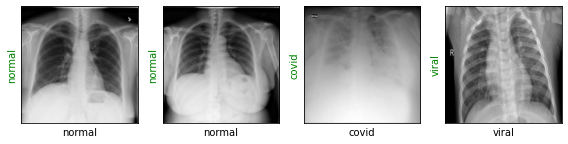

Evaluating at step 1480
Validation Loss: 0.1606, Accuracy: 0.9458


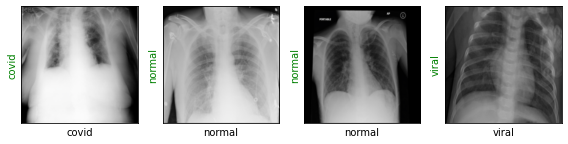

Evaluating at step 1500
Validation Loss: 0.1802, Accuracy: 0.9292


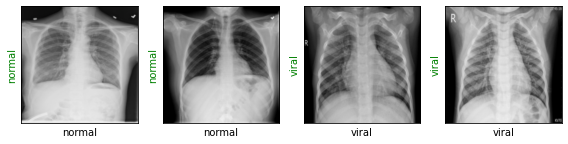

Evaluating at step 1520
Validation Loss: 0.1480, Accuracy: 0.9500


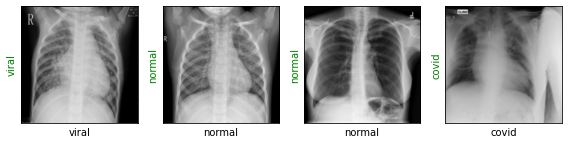

Evaluating at step 1540
Validation Loss: 0.1061, Accuracy: 0.9500


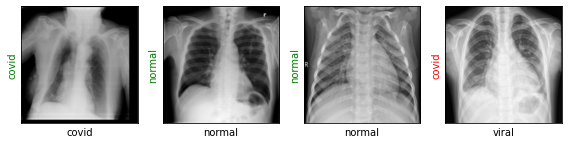

Evaluating at step 1560
Validation Loss: 0.1216, Accuracy: 0.9625


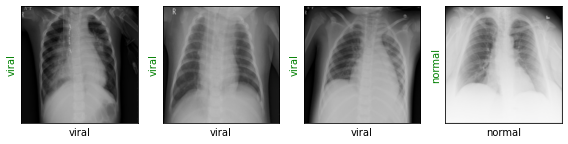

Evaluating at step 1580
Validation Loss: 0.1008, Accuracy: 0.9792


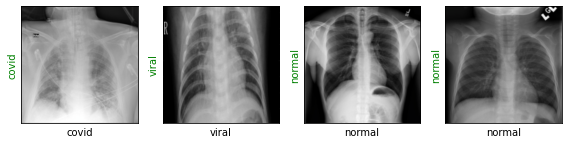

Evaluating at step 1600
Validation Loss: 0.1476, Accuracy: 0.9333


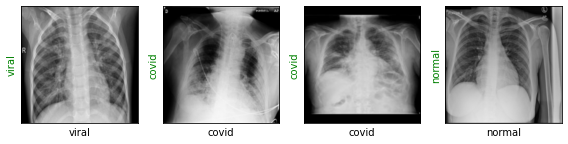

Evaluating at step 1620
Validation Loss: 0.1027, Accuracy: 0.9708


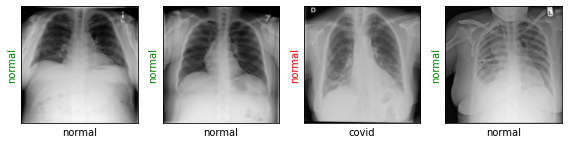

Evaluating at step 1640
Validation Loss: 0.1169, Accuracy: 0.9542


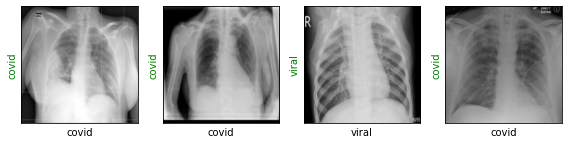

Evaluating at step 1660
Validation Loss: 0.1576, Accuracy: 0.9292


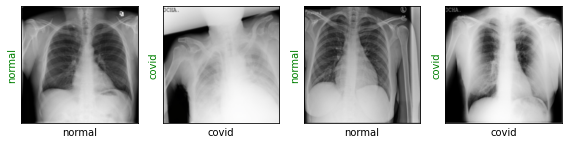

Evaluating at step 1680
Validation Loss: 0.1625, Accuracy: 0.9250


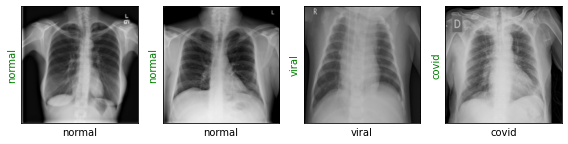

Evaluating at step 1700
Validation Loss: 0.1229, Accuracy: 0.9500


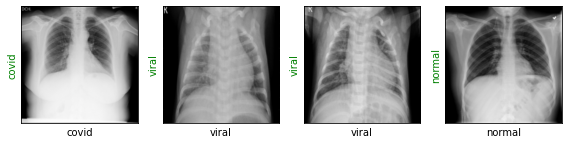

Evaluating at step 1720
Validation Loss: 0.2070, Accuracy: 0.9333


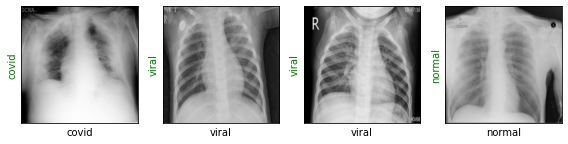

Evaluating at step 1740
Validation Loss: 0.0921, Accuracy: 0.9750


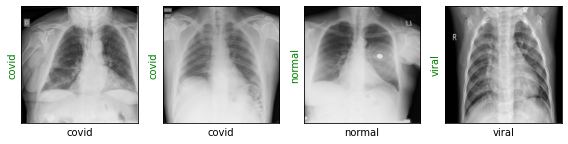

Evaluating at step 1760
Validation Loss: 0.1056, Accuracy: 0.9625


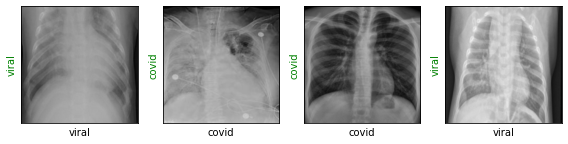

Evaluating at step 1780
Validation Loss: 0.0942, Accuracy: 0.9708


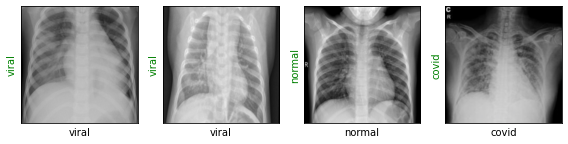

Evaluating at step 1800
Validation Loss: 0.1722, Accuracy: 0.9208


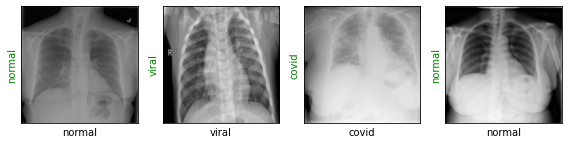

Evaluating at step 1820
Validation Loss: 0.0721, Accuracy: 0.9875


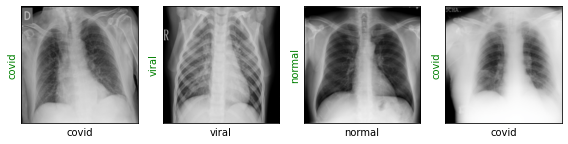

Performance condition satisfied, stopping..


In [19]:
train(epochs=1)

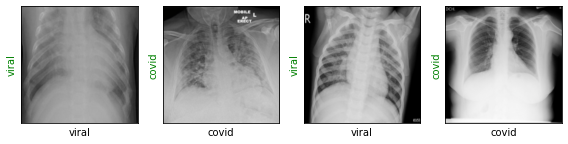

In [20]:
show_preds()

In [21]:
test_loader_pred = torch.utils.data.DataLoader(test_dataset, batch_size=4,shuffle=False)

In [22]:
import pandas as pd
accuracy=0
predicitions_df=pd.DataFrame(columns = ['Original','Predicted'])

for _, (images, labels) in enumerate(test_loader_pred):
    if use_gpu:
        images, labels = Variable(images.cuda()), Variable(labels.cuda())
    else:
        images, labels = Variable(images), Variable(labels)
    outputs = resnet50(images)
    loss = loss_fn(outputs, labels)
    _, preds = torch.max(outputs, 1)
    temp_df = pd.DataFrame(columns = ['Original','Predicted'])
    if use_gpu:
        temp_df['Original'] = labels.cpu().numpy()
        temp_df['Predicted'] = preds.cpu().numpy()
    else:
        temp_df['Original'] = labels.numpy()
        temp_df['Predicted'] = preds.numpy()
    predicitions_df=pd.concat([predicitions_df,temp_df],axis=0)
    accuracy += sum((preds.cpu() == labels.cpu()).numpy())

print('Overall Accuracy:'+ str(accuracy/len(test_dataset)))

Overall Accuracy:0.9958333333333333


In [23]:
len(predicitions_df[(predicitions_df['Original']==2) & (predicitions_df['Predicted']==2)])/len(predicitions_df[(predicitions_df['Original']==2)])

1.0

In [24]:
from sklearn.metrics import confusion_matrix
y_true = np.reshape(np.array(predicitions_df[['Original']].astype(int)),len(predicitions_df))
y_pred = np.reshape(np.array(predicitions_df[['Predicted']].astype(int)),len(predicitions_df))
confusion_matrix(y_true, y_pred)

array([[78,  0,  1],
       [ 0, 88,  0],
       [ 0,  0, 73]])

### Using Vgg19

In [25]:
from torchvision.models import vgg19
vgg19 = vgg19(pretrained=True)
print(vgg19)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [26]:
vgg19.classifier[6] = torch.nn.Linear(in_features=4096, out_features=3)
if use_gpu:
    vgg19 = vgg19.cuda()
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(vgg19.parameters(), lr=3e-5)

In [27]:
from torch.autograd import Variable
def show_vgg_preds():
    vgg19.eval()
    images, labels = next(iter(test_loader))
    use_gpu = torch.cuda.is_available()
    if use_gpu:
        images, labels = Variable(images.cuda()), Variable(labels.cuda())
    else:
        images, labels = Variable(images), Variable(labels)
    
    outputs = vgg19(images)
    _, preds = torch.max(outputs, 1)
    
    show_images(images.cpu(), labels.cpu(), preds.cpu())

In [28]:
def vgg_train(epochs):
    print('Starting training vgg19..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.
        use_gpu = torch.cuda.is_available()
        vgg19.train() # set model to training phase

        for train_step, (images, labels) in enumerate(train_loader):
            optimizer.zero_grad()
            if use_gpu:
                images, labels = Variable(images.cuda()), Variable(labels.cuda())
            else:
                images, labels = Variable(images), Variable(labels)
            outputs = vgg19(images)
            
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                vgg19.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(test_loader):
                    if use_gpu:
                        images, labels = Variable(images.cuda()), Variable(labels.cuda())
                    else:
                        images, labels = Variable(images), Variable(labels)
                    outputs = vgg19(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    if use_gpu:
                        accuracy += sum((preds.cpu() == labels.cpu()).numpy())
                    else:
                        accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_vgg_preds()

                vgg19.train()

                if accuracy >= 0.98:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

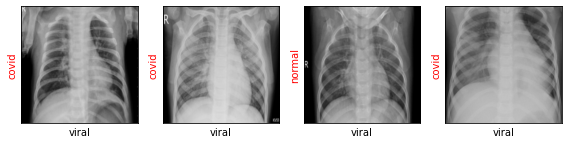

In [29]:
show_vgg_preds()

Starting training vgg19..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.1524, Accuracy: 0.3875


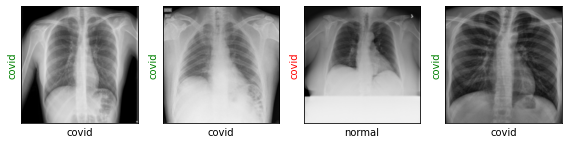

Evaluating at step 20
Validation Loss: 0.7145, Accuracy: 0.8000


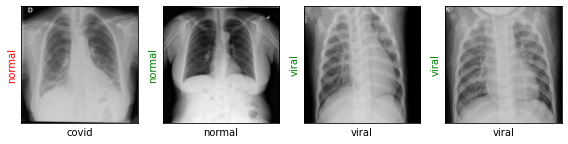

Evaluating at step 40
Validation Loss: 0.9033, Accuracy: 0.6708


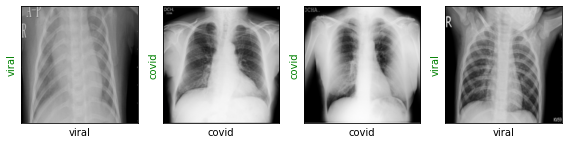

Evaluating at step 60
Validation Loss: 0.4981, Accuracy: 0.8083


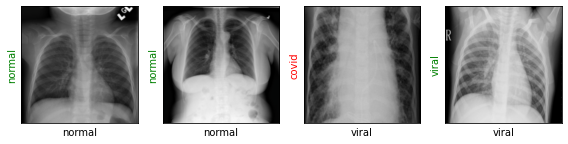

Evaluating at step 80
Validation Loss: 1.0883, Accuracy: 0.5875


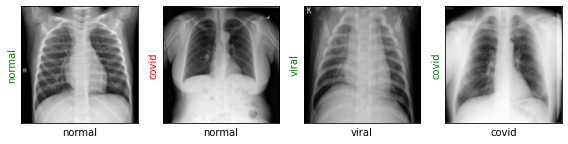

Evaluating at step 100
Validation Loss: 0.4421, Accuracy: 0.8583


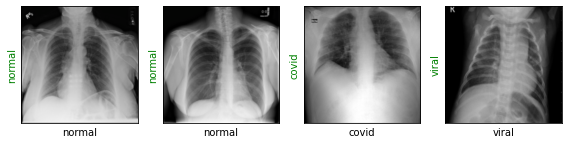

Evaluating at step 120
Validation Loss: 0.3126, Accuracy: 0.8833


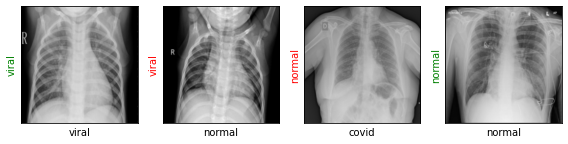

Evaluating at step 140
Validation Loss: 0.3817, Accuracy: 0.8625


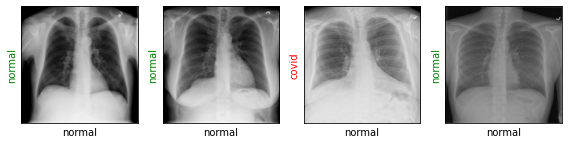

Evaluating at step 160
Validation Loss: 0.7250, Accuracy: 0.7167


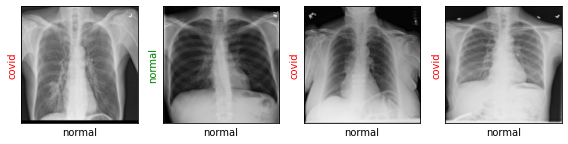

Evaluating at step 180
Validation Loss: 0.5149, Accuracy: 0.7792


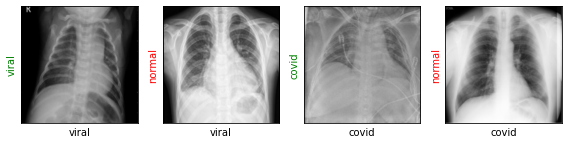

Evaluating at step 200
Validation Loss: 0.3097, Accuracy: 0.8792


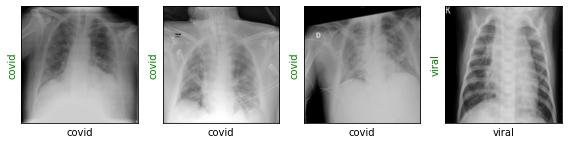

Evaluating at step 220
Validation Loss: 0.2401, Accuracy: 0.9125


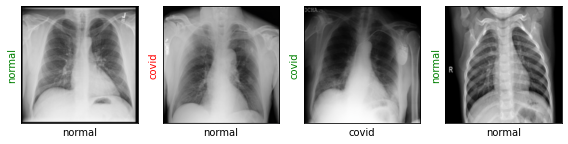

Evaluating at step 240
Validation Loss: 0.2780, Accuracy: 0.8917


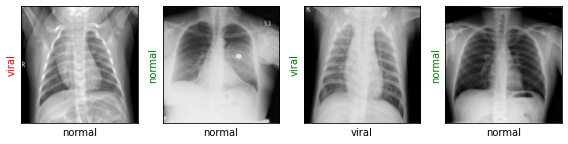

Evaluating at step 260
Validation Loss: 0.1910, Accuracy: 0.9292


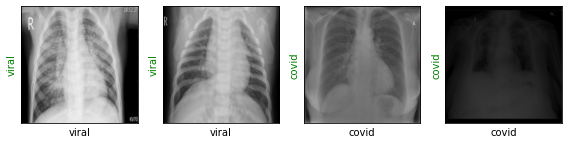

Evaluating at step 280
Validation Loss: 0.1802, Accuracy: 0.9458


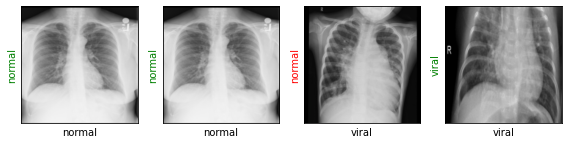

Evaluating at step 300
Validation Loss: 0.2093, Accuracy: 0.9333


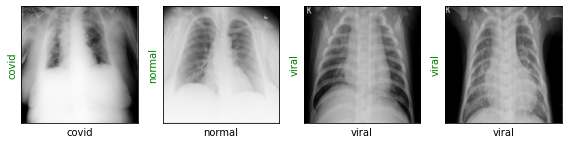

Evaluating at step 320
Validation Loss: 0.2305, Accuracy: 0.9500


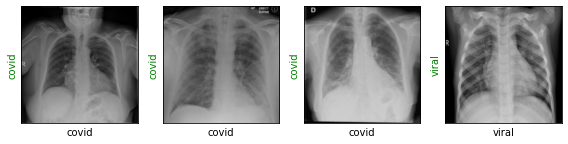

Evaluating at step 340
Validation Loss: 0.3869, Accuracy: 0.7875


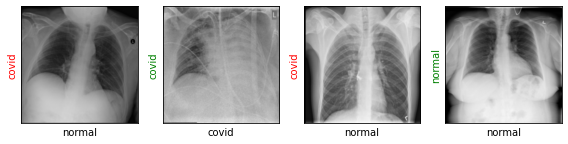

Evaluating at step 360
Validation Loss: 0.2280, Accuracy: 0.9042


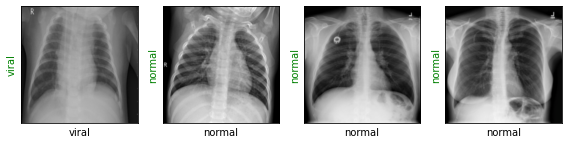

Evaluating at step 380
Validation Loss: 0.3240, Accuracy: 0.8458


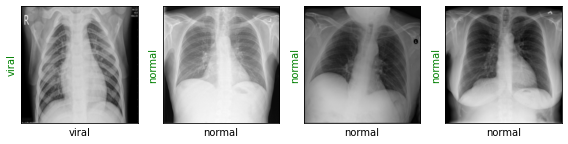

Evaluating at step 400
Validation Loss: 0.2951, Accuracy: 0.9042


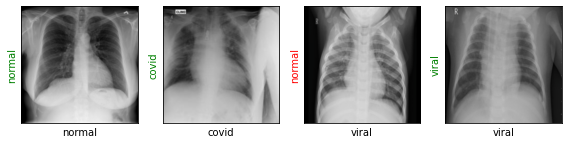

Evaluating at step 420
Validation Loss: 0.2992, Accuracy: 0.9125


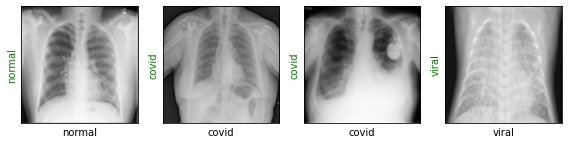

Evaluating at step 440
Validation Loss: 0.3670, Accuracy: 0.8333


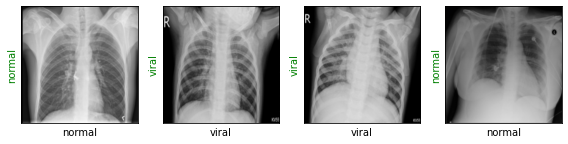

Evaluating at step 460
Validation Loss: 0.2399, Accuracy: 0.9208


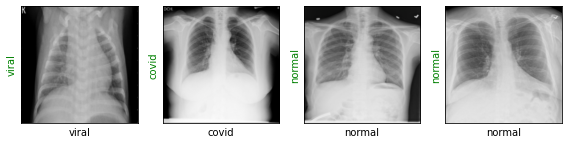

Evaluating at step 480
Validation Loss: 0.4706, Accuracy: 0.7833


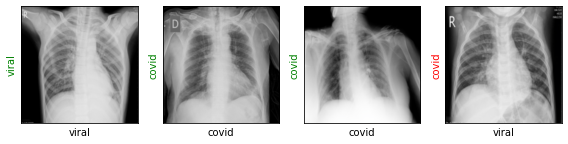

Evaluating at step 500
Validation Loss: 0.2840, Accuracy: 0.8750


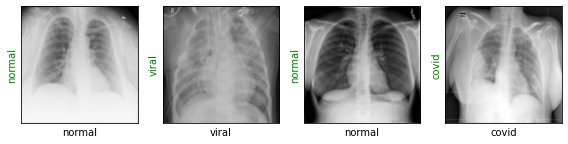

Evaluating at step 520
Validation Loss: 0.1410, Accuracy: 0.9500


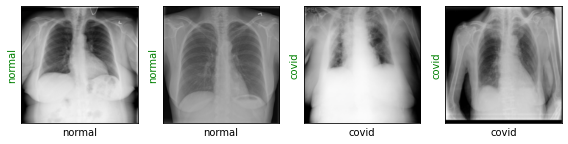

Evaluating at step 540
Validation Loss: 0.2045, Accuracy: 0.9208


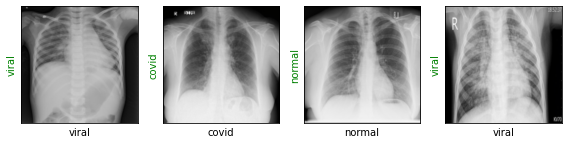

Evaluating at step 560
Validation Loss: 0.4695, Accuracy: 0.8042


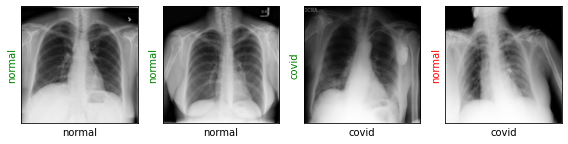

Evaluating at step 580
Validation Loss: 0.2109, Accuracy: 0.9167


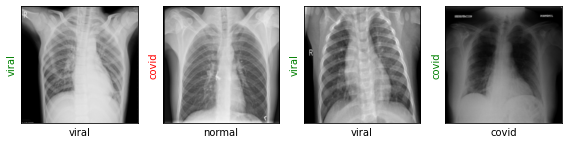

Evaluating at step 600
Validation Loss: 0.1868, Accuracy: 0.9208


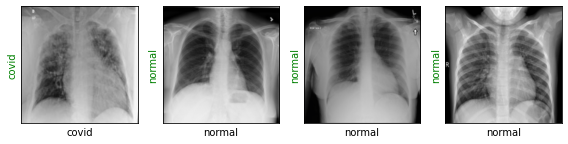

Evaluating at step 620
Validation Loss: 0.1803, Accuracy: 0.9333


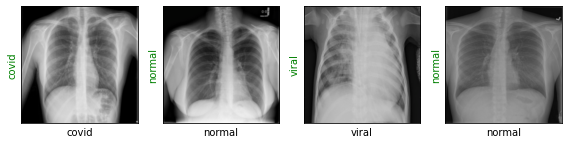

Evaluating at step 640
Validation Loss: 0.1289, Accuracy: 0.9583


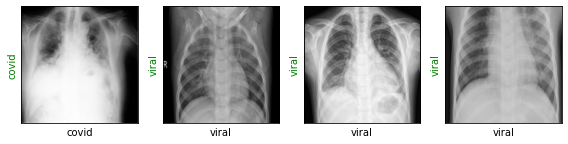

Evaluating at step 660
Validation Loss: 0.2334, Accuracy: 0.9208


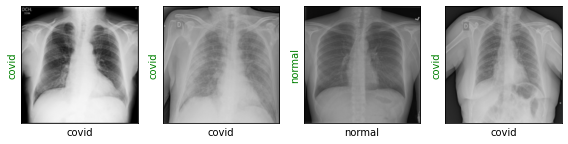

Evaluating at step 680
Validation Loss: 0.1649, Accuracy: 0.9417


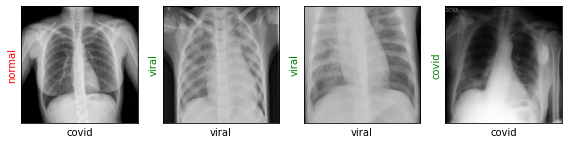

Evaluating at step 700
Validation Loss: 0.2104, Accuracy: 0.9250


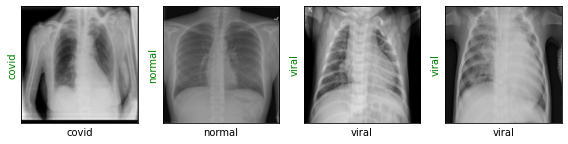

Evaluating at step 720
Validation Loss: 0.1444, Accuracy: 0.9458


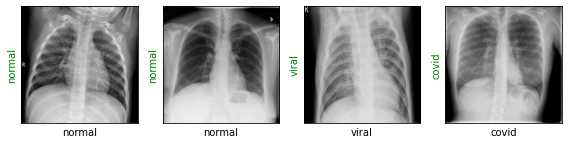

Evaluating at step 740
Validation Loss: 0.1281, Accuracy: 0.9583


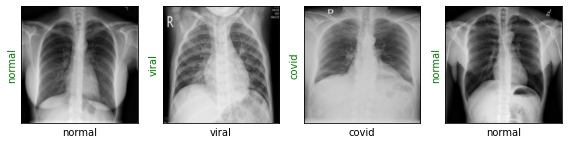

Evaluating at step 760
Validation Loss: 0.1343, Accuracy: 0.9417


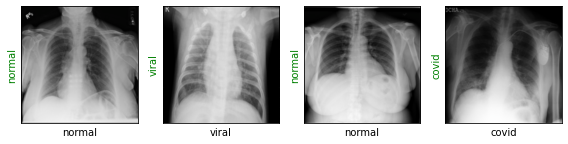

Evaluating at step 780
Validation Loss: 0.0971, Accuracy: 0.9708


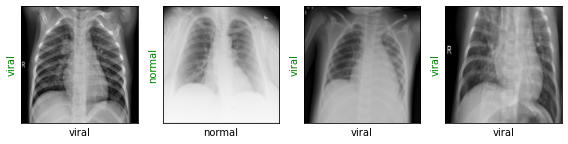

Evaluating at step 800
Validation Loss: 0.0889, Accuracy: 0.9667


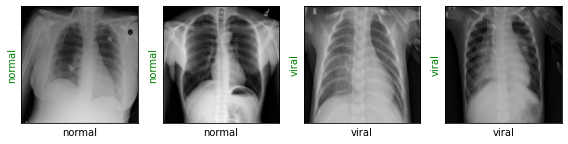

Evaluating at step 820
Validation Loss: 0.2532, Accuracy: 0.9125


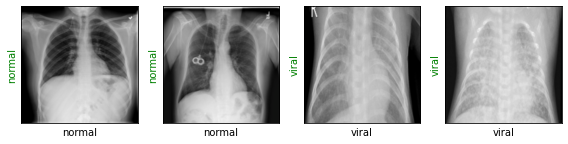

Evaluating at step 840
Validation Loss: 0.0981, Accuracy: 0.9708


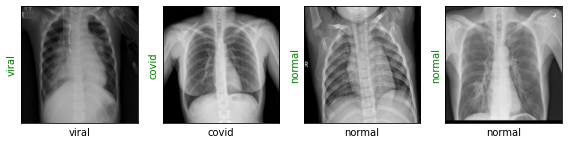

Evaluating at step 860
Validation Loss: 0.1479, Accuracy: 0.9542


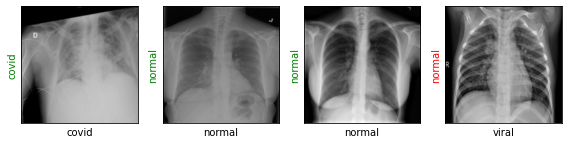

Evaluating at step 880
Validation Loss: 0.1091, Accuracy: 0.9708


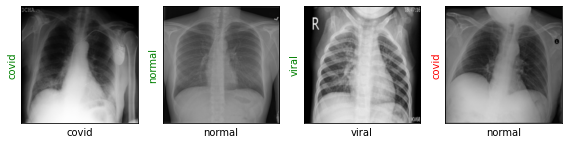

Evaluating at step 900
Validation Loss: 0.1140, Accuracy: 0.9625


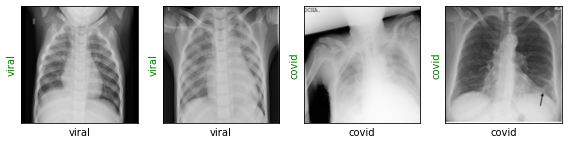

Evaluating at step 920
Validation Loss: 0.1487, Accuracy: 0.9375


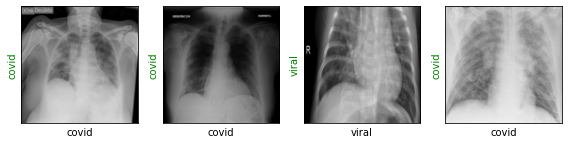

Evaluating at step 940
Validation Loss: 0.2573, Accuracy: 0.8708


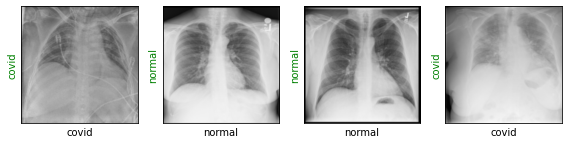

Evaluating at step 960
Validation Loss: 0.1717, Accuracy: 0.9458


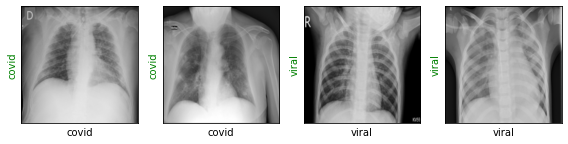

Evaluating at step 980
Validation Loss: 0.1427, Accuracy: 0.9625


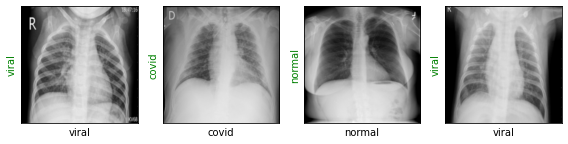

Evaluating at step 1000
Validation Loss: 0.0922, Accuracy: 0.9708


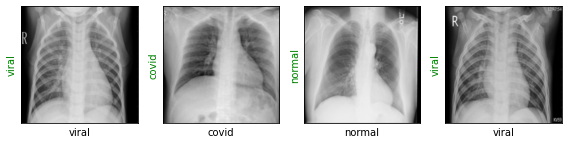

Evaluating at step 1020
Validation Loss: 0.1203, Accuracy: 0.9625


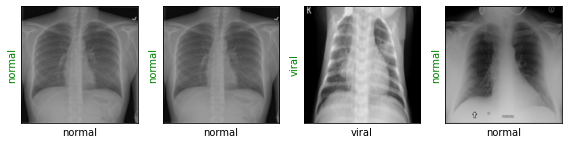

Evaluating at step 1040
Validation Loss: 0.1495, Accuracy: 0.9333


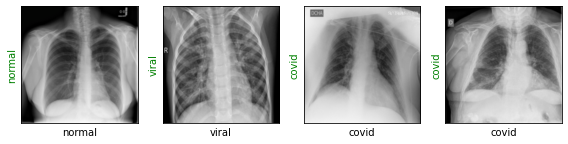

Evaluating at step 1060
Validation Loss: 0.5380, Accuracy: 0.8667


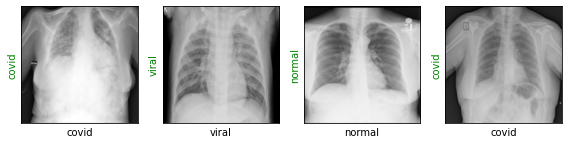

Evaluating at step 1080
Validation Loss: 0.2014, Accuracy: 0.9042


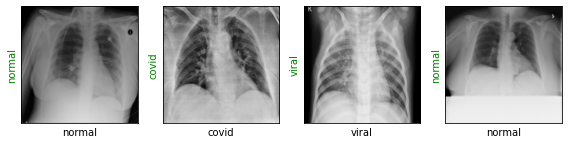

Evaluating at step 1100
Validation Loss: 0.2457, Accuracy: 0.9000


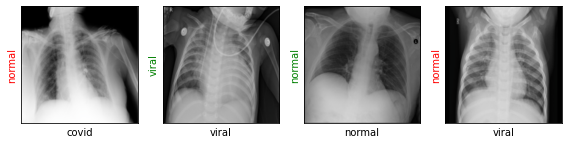

Evaluating at step 1120
Validation Loss: 0.5056, Accuracy: 0.8667


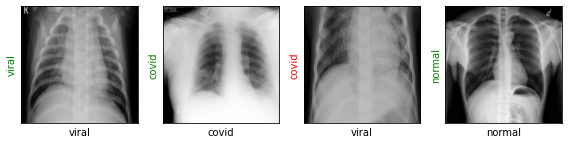

Evaluating at step 1140
Validation Loss: 0.1834, Accuracy: 0.9333


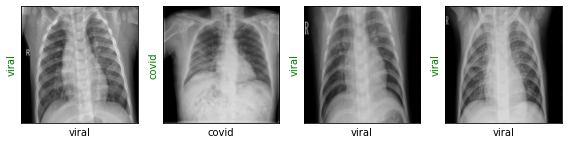

Evaluating at step 1160
Validation Loss: 0.1796, Accuracy: 0.9250


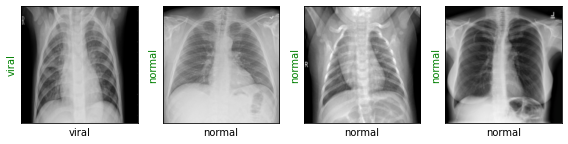

Evaluating at step 1180
Validation Loss: 0.3207, Accuracy: 0.8750


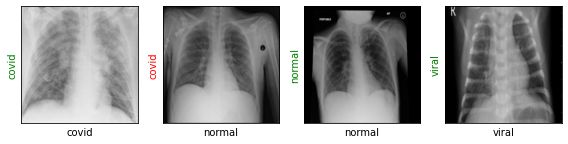

Evaluating at step 1200
Validation Loss: 0.1821, Accuracy: 0.9375


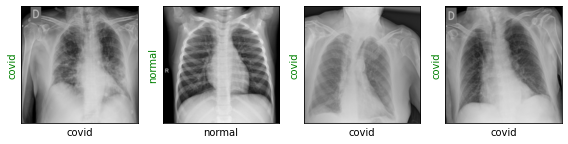

Evaluating at step 1220
Validation Loss: 0.1331, Accuracy: 0.9417


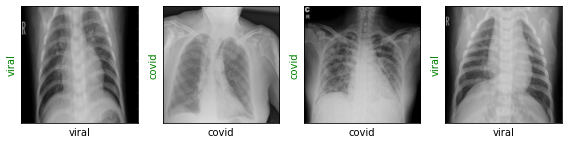

Evaluating at step 1240
Validation Loss: 0.1901, Accuracy: 0.9583


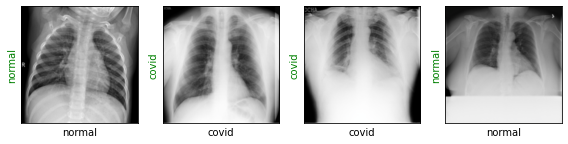

Evaluating at step 1260
Validation Loss: 0.1887, Accuracy: 0.9375


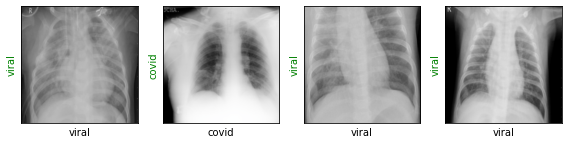

Evaluating at step 1280
Validation Loss: 0.2770, Accuracy: 0.9333


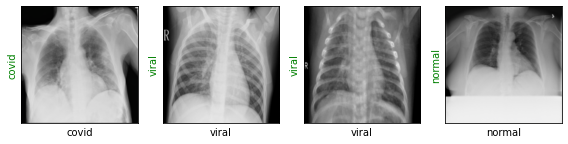

Evaluating at step 1300
Validation Loss: 0.2273, Accuracy: 0.8917


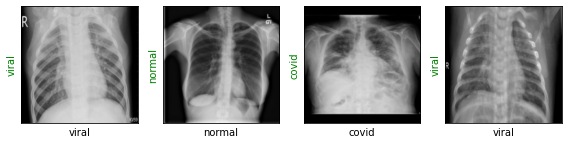

Evaluating at step 1320
Validation Loss: 0.1267, Accuracy: 0.9708


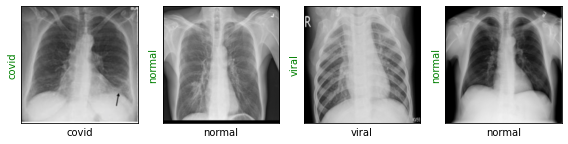

Evaluating at step 1340
Validation Loss: 0.1877, Accuracy: 0.9125


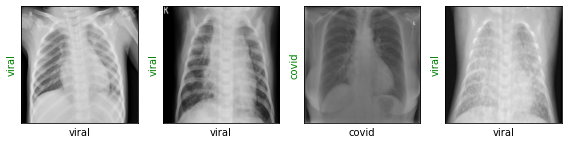

Evaluating at step 1360
Validation Loss: 0.1280, Accuracy: 0.9500


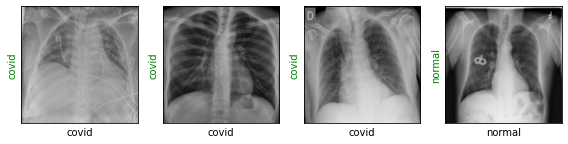

Evaluating at step 1380
Validation Loss: 0.2099, Accuracy: 0.9417


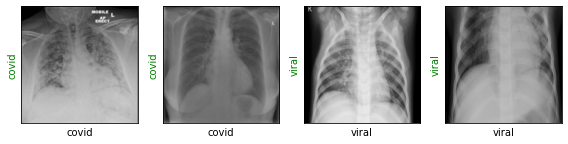

Evaluating at step 1400
Validation Loss: 0.1914, Accuracy: 0.9375


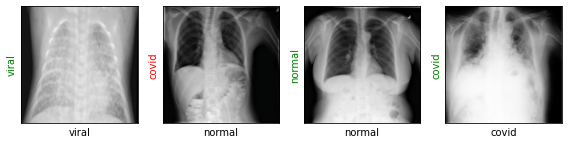

Evaluating at step 1420
Validation Loss: 0.2277, Accuracy: 0.9292


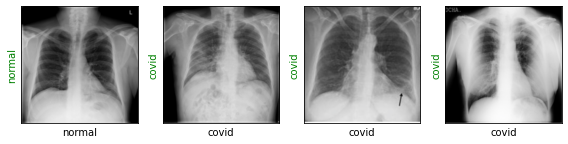

Evaluating at step 1440
Validation Loss: 0.1846, Accuracy: 0.9417


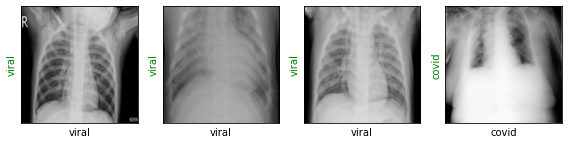

Evaluating at step 1460
Validation Loss: 0.1832, Accuracy: 0.9542


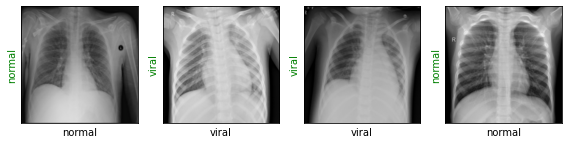

Evaluating at step 1480
Validation Loss: 0.1347, Accuracy: 0.9500


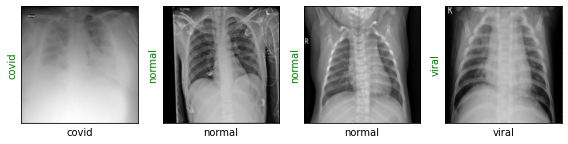

Evaluating at step 1500
Validation Loss: 0.2162, Accuracy: 0.9333


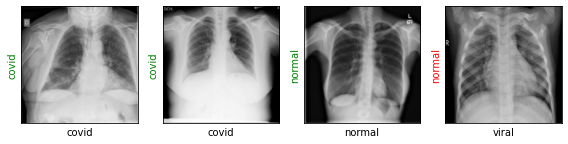

Evaluating at step 1520
Validation Loss: 0.1159, Accuracy: 0.9625


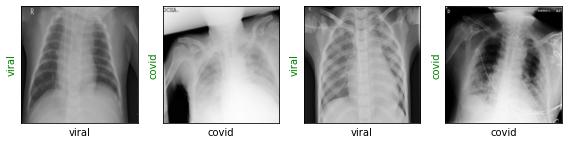

Evaluating at step 1540
Validation Loss: 0.1589, Accuracy: 0.9458


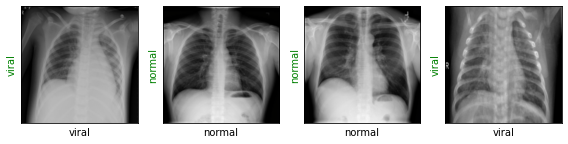

Evaluating at step 1560
Validation Loss: 0.0702, Accuracy: 0.9792


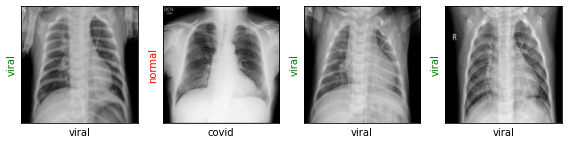

Evaluating at step 1580
Validation Loss: 0.1043, Accuracy: 0.9583


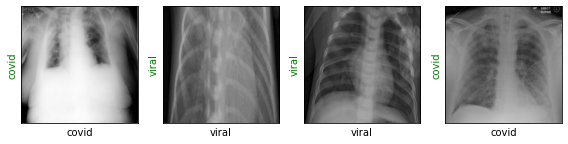

Evaluating at step 1600
Validation Loss: 0.1209, Accuracy: 0.9458


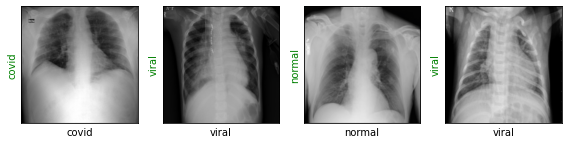

Evaluating at step 1620
Validation Loss: 0.1364, Accuracy: 0.9542


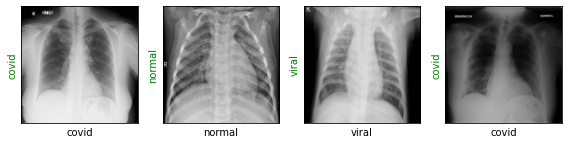

Evaluating at step 1640
Validation Loss: 0.1170, Accuracy: 0.9500


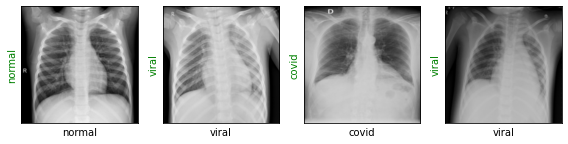

Evaluating at step 1660
Validation Loss: 0.1150, Accuracy: 0.9542


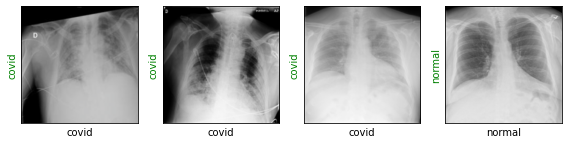

Evaluating at step 1680
Validation Loss: 0.0831, Accuracy: 0.9708


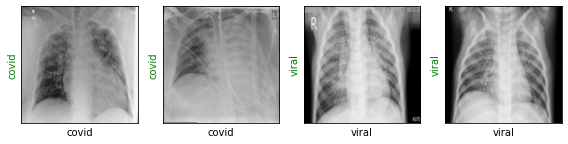

Evaluating at step 1700
Validation Loss: 0.3181, Accuracy: 0.8958


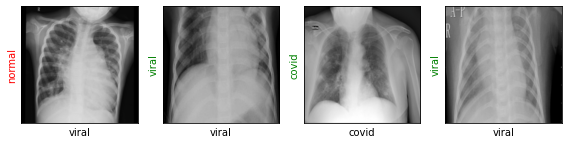

Evaluating at step 1720
Validation Loss: 0.2679, Accuracy: 0.8708


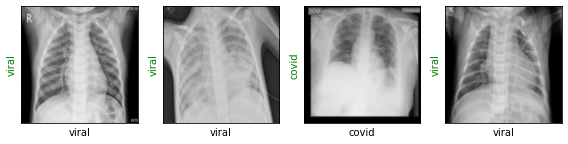

Evaluating at step 1740
Validation Loss: 0.2817, Accuracy: 0.9042


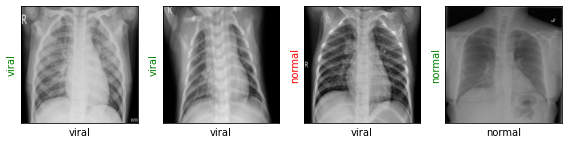

Evaluating at step 1760
Validation Loss: 0.1359, Accuracy: 0.9583


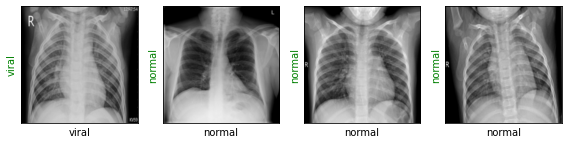

Evaluating at step 1780
Validation Loss: 0.0958, Accuracy: 0.9542


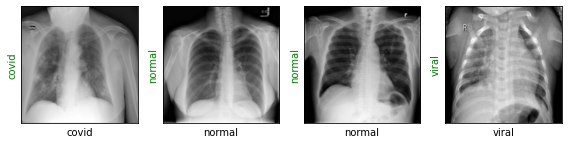

Evaluating at step 1800
Validation Loss: 0.1799, Accuracy: 0.9333


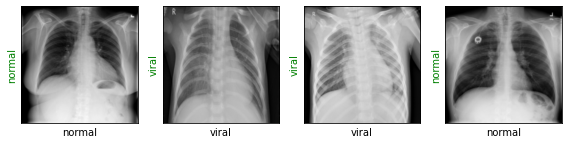

Evaluating at step 1820
Validation Loss: 0.1191, Accuracy: 0.9667


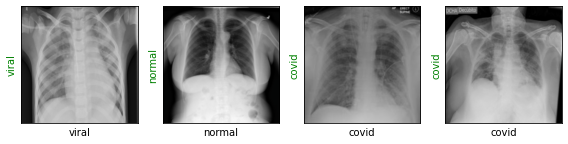

Evaluating at step 1840
Validation Loss: 0.0860, Accuracy: 0.9708


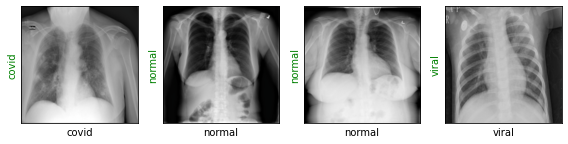

Evaluating at step 1860
Validation Loss: 0.0770, Accuracy: 0.9708


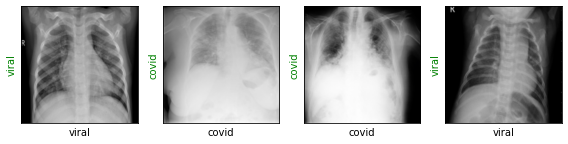

Evaluating at step 1880
Validation Loss: 0.1487, Accuracy: 0.9417


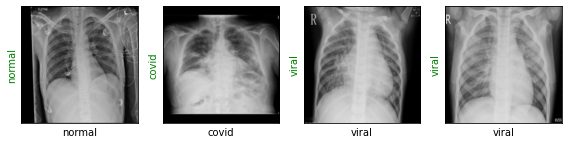

Evaluating at step 1900
Validation Loss: 0.1510, Accuracy: 0.9333


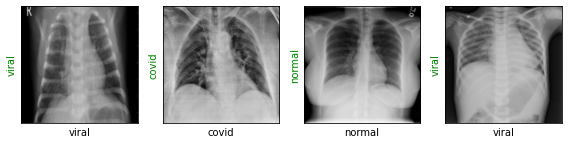

Evaluating at step 1920
Validation Loss: 0.0883, Accuracy: 0.9708


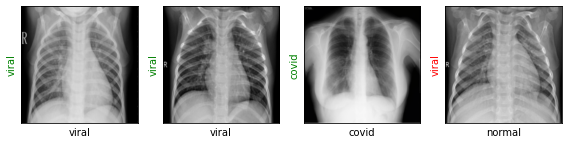

Evaluating at step 1940
Validation Loss: 0.1660, Accuracy: 0.9458


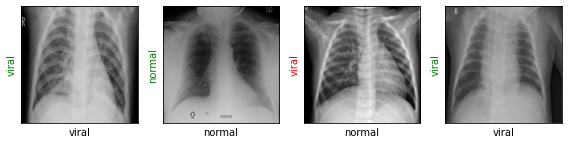

Evaluating at step 1960
Validation Loss: 0.0928, Accuracy: 0.9708


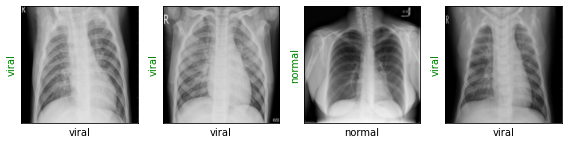

Evaluating at step 1980
Validation Loss: 0.0669, Accuracy: 0.9833


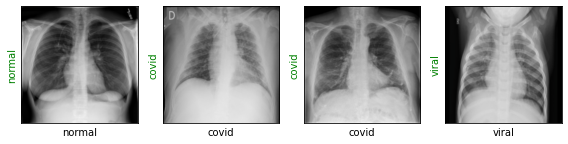

Performance condition satisfied, stopping..


In [30]:
vgg_train(epochs=1)

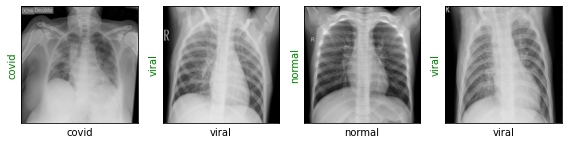

In [31]:
show_vgg_preds()

In [32]:
test_loader_pred = torch.utils.data.DataLoader(test_dataset, batch_size=4,shuffle=False)

In [33]:
import pandas as pd
accuracy=0
vgg_predicitions_df=pd.DataFrame(columns = ['Original','Predicted'])

for _, (images, labels) in enumerate(test_loader_pred):
    if use_gpu:
        images, labels = Variable(images.cuda()), Variable(labels.cuda())
    else:
        images, labels = Variable(images), Variable(labels)
    outputs = vgg19(images)
    loss = loss_fn(outputs, labels)
    _, preds = torch.max(outputs, 1)
    temp_df = pd.DataFrame(columns = ['Original','Predicted'])
    if use_gpu:
        temp_df['Original'] = labels.cpu().numpy()
        temp_df['Predicted'] = preds.cpu().numpy()
        accuracy += sum((preds.cpu() == labels.cpu()).numpy())
    else:
        temp_df['Original'] = labels.numpy()
        temp_df['Predicted'] = preds.numpy()
        accuracy += sum((preds == labels).numpy())
    vgg_predicitions_df=pd.concat([vgg_predicitions_df,temp_df],axis=0)    

print('Overall Accuracy:'+ str(accuracy/len(test_dataset)))

Overall Accuracy:0.9666666666666667


In [34]:
len(vgg_predicitions_df[(vgg_predicitions_df['Original']==2) & (vgg_predicitions_df['Predicted']==2)])/len(vgg_predicitions_df[(vgg_predicitions_df['Original']==2)])

1.0

In [35]:
from sklearn.metrics import confusion_matrix
y_true = np.reshape(np.array(vgg_predicitions_df[['Original']].astype(int)),len(vgg_predicitions_df))
y_pred = np.reshape(np.array(vgg_predicitions_df[['Predicted']].astype(int)),len(vgg_predicitions_df))
confusion_matrix(y_true, y_pred)

array([[67,  2,  4],
       [ 0, 85,  2],
       [ 0,  0, 80]])